In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import plotly as py
from plotly import tools
from plotly.offline import iplot
from plotly.subplots import make_subplots
import seaborn as sns
sns.set()

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
#load the dataset
from google.colab import files
uploaded = files.upload()


Saving Pakistan Largest Ecommerce Dataset.csv to Pakistan Largest Ecommerce Dataset.csv


In [3]:
data=pd.read_csv('Pakistan Largest Ecommerce Dataset.csv',parse_dates=['created_at'])
print("Data Dimensions are: ", data.shape)
data.columns=data.columns.str.replace(" ", "_").str.lower()
print("Columns: ", data.columns)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (1,3,7,8,9,11,12,13,14,17,18,19) have mixed types.Specify dtype option on import or set low_memory=False.



Data Dimensions are:  (1048575, 26)
Columns:  Index(['item_id', 'status', 'created_at', 'sku', 'price', 'qty_ordered',
       'grand_total', 'increment_id', 'category_name_1',
       'sales_commission_code', 'discount_amount', 'payment_method',
       'working_date', 'bi_status', '_mv_', 'year', 'month', 'customer_since',
       'm-y', 'fy', 'customer_id', 'unnamed:_21', 'unnamed:_22', 'unnamed:_23',
       'unnamed:_24', 'unnamed:_25'],
      dtype='object')


In [4]:
data.head()

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,discount_amount,payment_method,working_date,bi_status,_mv_,year,month,customer_since,m-y,fy,customer_id,unnamed:_21,unnamed:_22,unnamed:_23,unnamed:_24,unnamed:_25
0,211131.0,complete,2016-07-01,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,\N,0.0,cod,7/1/2016,#REF!,"1,950",2016.0,7.0,2016-7,7-2016,FY17,1.0,NaN,NaN,NaN,NaN,NaN
1,211133.0,canceled,2016-07-01,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,\N,0.0,cod,7/1/2016,Gross,240,2016.0,7.0,2016-7,7-2016,FY17,2.0,NaN,NaN,NaN,NaN,NaN
2,211134.0,canceled,2016-07-01,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,\N,0.0,cod,7/1/2016,Gross,"2,450",2016.0,7.0,2016-7,7-2016,FY17,3.0,NaN,NaN,NaN,NaN,NaN
3,211135.0,complete,2016-07-01,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,300.0,cod,7/1/2016,Net,360,2016.0,7.0,2016-7,7-2016,FY17,4.0,NaN,NaN,NaN,NaN,NaN
4,211136.0,order_refunded,2016-07-01,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,\N,0.0,cod,7/1/2016,Valid,"1,110",2016.0,7.0,2016-7,7-2016,FY17,5.0,NaN,NaN,NaN,NaN,NaN


In [5]:
#Data exploration
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 26 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   item_id                584524 non-null  float64       
 1   status                 584509 non-null  object        
 2   created_at             584524 non-null  datetime64[ns]
 3   sku                    584504 non-null  object        
 4   price                  584524 non-null  float64       
 5   qty_ordered            584524 non-null  float64       
 6   grand_total            584524 non-null  float64       
 7   increment_id           584524 non-null  object        
 8   category_name_1        584360 non-null  object        
 9   sales_commission_code  447349 non-null  object        
 10  discount_amount        584524 non-null  float64       
 11  payment_method         584524 non-null  object        
 12  working_date           584524 non-null  ob

In [6]:
data.dtypes

item_id                         float64
status                           object
created_at               datetime64[ns]
sku                              object
price                           float64
qty_ordered                     float64
grand_total                     float64
increment_id                     object
category_name_1                  object
sales_commission_code            object
discount_amount                 float64
payment_method                   object
working_date                     object
bi_status                        object
_mv_                             object
year                            float64
month                           float64
customer_since                   object
m-y                              object
fy                               object
customer_id                     float64
unnamed:_21                     float64
unnamed:_22                     float64
unnamed:_23                     float64
unnamed:_24                     float64


In [7]:
# Quantifying null values
print(data.isnull().sum())

item_id                   464051
status                    464066
created_at                464051
sku                       464071
price                     464051
qty_ordered               464051
grand_total               464051
increment_id              464051
category_name_1           464215
sales_commission_code     601226
discount_amount           464051
payment_method            464051
working_date              464051
bi_status                 464051
_mv_                      464051
year                      464051
month                     464051
customer_since            464062
m-y                       464051
fy                        464051
customer_id               464062
unnamed:_21              1048575
unnamed:_22              1048575
unnamed:_23              1048575
unnamed:_24              1048575
unnamed:_25              1048575
dtype: int64


Text(0.5, 1.0, 'Quantifying missing data')

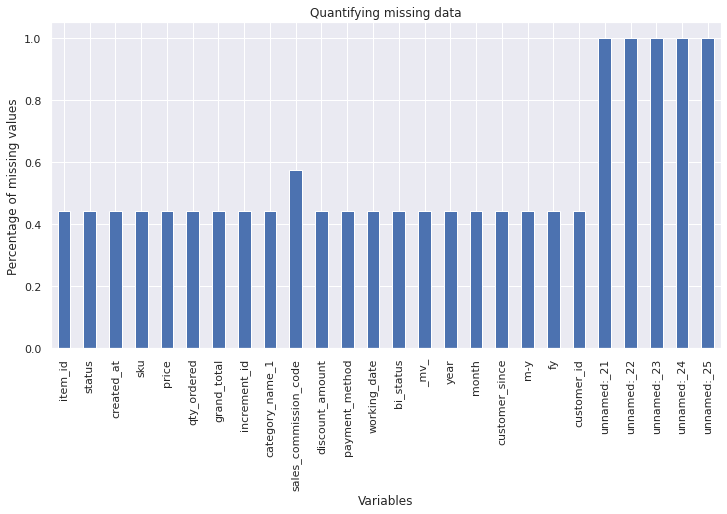

In [8]:
# Visualizing the percentage of null values
data.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')

Above visualization shows percentage of missing value for each column in dataset

Columns Unnamed 21 to Unnamed 25 are 100% null
Columns sales_commission_code has above 50% null values
All the remaining columns have about 40% null values

In [9]:
data.drop(["unnamed:_21", "unnamed:_22", "unnamed:_23", "unnamed:_24", "unnamed:_25"], axis = 1, inplace=True)
data.dropna(how='all', axis=0, inplace=True)
data.rename(columns={"_mv_": "mv", "category_name_1": "category_name"}, inplace = True)

In [10]:
# Quantifying null values
print(data.isnull().sum())

item_id                       0
status                       15
created_at                    0
sku                          20
price                         0
qty_ordered                   0
grand_total                   0
increment_id                  0
category_name               164
sales_commission_code    137175
discount_amount               0
payment_method                0
working_date                  0
bi_status                     0
mv                            0
year                          0
month                         0
customer_since               11
m-y                           0
fy                            0
customer_id                  11
dtype: int64


In [11]:
# inspect unique values - categorical variable
data['status'].unique()

array(['complete', 'canceled', 'order_refunded', 'received', 'refund',
       'closed', 'fraud', 'holded', 'exchange', 'pending_paypal', 'paid',
       '\\N', 'cod', 'pending', nan, 'processing', 'payment_review'],
      dtype=object)

In [12]:
data.groupby('bi_status')['status'].value_counts()

bi_status  status        
#REF!      complete               1
Gross      canceled          201249
           payment_review        57
           pending               48
           processing            33
           holded                31
           fraud                 10
           pending_paypal         7
           \N                     4
Net        complete          233684
           closed               494
Valid      received           77290
           order_refunded     59529
           refund              8050
           cod                 2859
           paid                1159
           exchange               4
Name: status, dtype: int64

In [13]:
data['status'] = data['status'].replace(r'\\N', 'Cancelled', regex=True)

In [14]:
# For simplicity we can merge all statuses into Completed, Cancelled and Refund
dict_status = {'Completed':['complete','closed','received','cod','paid','exchange','payment_review','pending','processing','holded','pending_paypal'],'Refund':['order_refunded','refund'], 'Cancelled':['canceled','fraud',np.nan]}
for n in range(len(dict_status)):
    key,value=list(dict_status.items())[n]
    data['status'].replace(value, key,inplace=True)
    n+=1

In [15]:
data['status'].value_counts()

Completed    315667
Cancelled    201278
Refund        67579
Name: status, dtype: int64

Text(0.5, 1.0, 'Status  - Distinct Counts')

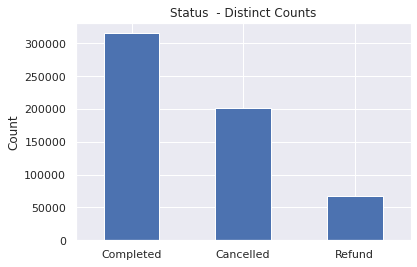

In [16]:
# bar plots for status categorical variables

data['status'].value_counts().plot.bar()
plt.xticks(rotation=0)
plt.ylabel('Count')
plt.title('Status  - Distinct Counts')

In [17]:
# Check for relevance of different features of dataset
data[['created_at','working_date','sku','qty_ordered','price','grand_total','mv','discount_amount','sales_commission_code','customer_id']].head()

,created_at,working_date,sku,qty_ordered,price,grand_total,mv,discount_amount,sales_commission_code,customer_id
0,2016-07-01,7/1/2016,kreations_YI 06-L,1.0,1950.0,1950.0,"1,950",0.0,\N,1.0
1,2016-07-01,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,1.0,240.0,240.0,240,0.0,\N,2.0
2,2016-07-01,7/1/2016,Ego_UP0017-999-MR0,1.0,2450.0,2450.0,"2,450",0.0,\N,3.0
3,2016-07-01,7/1/2016,kcc_krone deal,1.0,360.0,60.0,360,300.0,R-FSD-52352,4.0
4,2016-07-01,7/1/2016,BK7010400AG,2.0,555.0,1110.0,"1,110",0.0,\N,5.0


In [18]:
data.drop(['working_date', 'mv', 'increment_id','bi_status','sales_commission_code'],axis=1,inplace=True)

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 584524 entries, 0 to 584523
Data columns (total 16 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   item_id          584524 non-null  float64       
 1   status           584524 non-null  object        
 2   created_at       584524 non-null  datetime64[ns]
 3   sku              584504 non-null  object        
 4   price            584524 non-null  float64       
 5   qty_ordered      584524 non-null  float64       
 6   grand_total      584524 non-null  float64       
 7   category_name    584360 non-null  object        
 8   discount_amount  584524 non-null  float64       
 9   payment_method   584524 non-null  object        
 10  year             584524 non-null  float64       
 11  month            584524 non-null  float64       
 12  customer_since   584513 non-null  object        
 13  m-y              584524 non-null  object        
 14  fy               584

In [21]:
data.isnull().sum()

item_id              0
status               0
created_at           0
sku                 20
price                0
qty_ordered          0
grand_total          0
category_name      164
discount_amount      0
payment_method       0
year                 0
month                0
customer_since      11
m-y                  0
fy                   0
customer_id         11
dtype: int64

**Checking null/not defined values in categorical variable category_name**

In [22]:
print("Count Different Categories: ")
print(data['category_name'].value_counts(dropna=False))

Count Different Categories: 
Mobiles & Tablets     115710
Men's Fashion          92221
Women's Fashion        59721
Appliances             52413
Superstore             43613
Beauty & Grooming      41496
Soghaat                34011
Others                 29218
Home & Living          26504
Entertainment          26326
Health & Sports        17502
Kids & Baby            16494
Computing              15933
\N                      7850
School & Education      3478
Books                   1870
NaN                      164
Name: category_name, dtype: int64


In [23]:
# Extracting all unique categories for category value'\N'
skunique=data[data['category_name']==r'\N']['sku'].unique().tolist()

In [24]:
#Now we check for sku's found against '\N' category in other categories 
sku_nil=data[data['sku'].isin(skunique)]
sku_nil['category_name'].value_counts()

\N                   7850
Men's Fashion         739
Others                556
Superstore             13
Mobiles & Tablets      10
Women's Fashion         8
Entertainment           3
Appliances              2
Name: category_name, dtype: int64

In [25]:
# We found sku with '\N' category also in categories as mentioned above
# Updating the sku category '\N' where same sku found in above categories and all remaining values of sku with Other's  
dict_sku={}
cat=["Men's Fashion",'Others','Superstore','Mobiles & Tablets',"Women's Fashion",'Entertainment','Appliances']
for n in cat:
    dict_sku[n]= n
for n in range(len(dict_sku)):
    key,value=list(dict_sku.items())[n]
    dict_sku[key]=sku_nil[sku_nil['category_name']== key]['sku'].unique().tolist()
    data.loc[((data['sku'].isin(dict_sku[key])) & (data['category_name']==r'\N')),'category_name']= key
    n+=1

In [26]:
data.loc[(data['category_name']==r'\N'),'category_name']= 'Others'
data['category_name'] = data['category_name'].replace(np.nan, 'Others', regex=True)

Text(0.5, 1.0, 'Sales Category Wise')

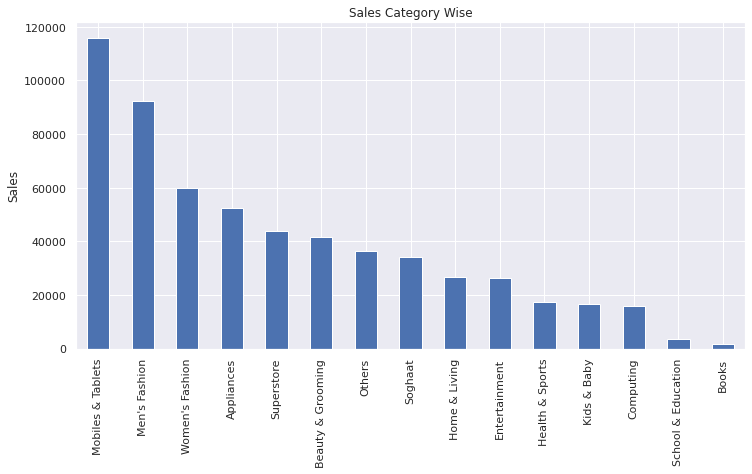

In [27]:
# Categories after updating all '\N' and null categories
data['category_name'].value_counts(dropna=False).plot.bar(figsize=(12,6))
#plt.xticks(rotation=0)
plt.ylabel('Sales')
plt.title('Sales Category Wise')

In [28]:
data[data['sku'].isnull()]

,item_id,status,created_at,sku,price,qty_ordered,grand_total,category_name,discount_amount,payment_method,year,month,customer_since,m-y,fy,customer_id
14846,230008.0,Cancelled,2016-08-13,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,8.0,2016-8,8-2016,FY17,3468.0
20676,236830.0,Cancelled,2016-09-01,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,9.0,2016-8,9-2016,FY17,4369.0
39838,260006.0,Cancelled,2016-10-07,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,10.0,2016-7,10-2016,FY17,939.0
39839,260007.0,Cancelled,2016-10-07,NaN,0.0,3.0,0.0,Entertainment,0.0,cod,2016.0,10.0,2016-7,10-2016,FY17,939.0
39880,260061.0,Cancelled,2016-10-07,NaN,0.0,3.0,0.0,Entertainment,0.0,cod,2016.0,10.0,2016-7,10-2016,FY17,939.0
124968,367292.0,Refund,2016-12-10,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,12.0,2016-11,12-2016,FY17,26305.0
125636,368122.0,Refund,2016-12-12,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,12.0,2016-7,12-2016,FY17,2246.0
125811,368362.0,Refund,2016-12-13,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2016.0,12.0,2016-7,12-2016,FY17,251.0
149597,399798.0,Refund,2017-02-07,NaN,0.0,1.0,0.0,Entertainment,0.0,cod,2017.0,2.0,2017-2,2-2017,FY17,33062.0
170249,426105.0,Cancelled,2017-03-21,NaN,0.0,1.0,6952.0,Entertainment,0.0,cod,2017.0,3.0,2017-3,3-2017,FY17,38242.0


In [29]:
# As out of 20 null sku values,  most of the order statuses are either cancelled or refund with grand_total 0.
# Replacing nan values with sku_nan
data['sku'].fillna("sku_nan",inplace=True)

In [30]:
#Checking null values in columns customer_id and customer_since
data[data['customer_id'].isnull()]

,item_id,status,created_at,sku,price,qty_ordered,grand_total,category_name,discount_amount,payment_method,year,month,customer_since,m-y,fy,customer_id
427377,726862.0,Refund,2018-01-05,BAGLOR5A12C5C756AE5,209.0,1.0,1074.0,Beauty & Grooming,0.0,cod,2018.0,1.0,NaN,1-2018,FY18,NaN
427378,726863.0,Refund,2018-01-05,WOFGUL59C24CC9BE5D9,720.0,1.0,1074.0,Women's Fashion,0.0,cod,2018.0,1.0,NaN,1-2018,FY18,NaN
427379,726864.0,Refund,2018-01-05,BAGNAD59E0AAC250E6D,145.0,1.0,1074.0,Beauty & Grooming,0.0,cod,2018.0,1.0,NaN,1-2018,FY18,NaN
437567,738191.0,Refund,2018-01-31,MEFMUN5A0ACC3A894BE-9,999.0,1.0,1149.0,Men's Fashion,0.0,cod,2018.0,1.0,NaN,1-2018,FY18,NaN
478699,784981.0,Completed,2018-03-15,OTHPCB5A7D8A0DA56C6,8000.0,2.0,16000.0,Others,0.0,Payaxis,2018.0,3.0,NaN,3-2018,FY18,NaN
478779,785061.0,Cancelled,2018-03-15,OTHPCB5A7D8A0DA56C6,8000.0,2.0,16000.0,Others,0.0,Easypay_MA,2018.0,3.0,NaN,3-2018,FY18,NaN
494278,804621.0,Cancelled,2018-03-27,OTHPCB5AB351ED6A8F2,5000.0,2.0,10000.0,Others,0.0,Easypay,2018.0,3.0,NaN,3-2018,FY18,NaN
495340,805750.0,Cancelled,2018-03-27,OTHPCB5AB351ECC7118,500.0,2.0,1000.0,Others,0.0,Easypay,2018.0,3.0,NaN,3-2018,FY18,NaN
495945,807010.0,Cancelled,2018-03-27,OTHPCB5AB351EEC46EC,500.0,4.0,2000.0,Others,0.0,Easypay,2018.0,3.0,NaN,3-2018,FY18,NaN
496921,808287.0,Refund,2018-03-27,MEFKAR5A7C138CE9EBD-L,1040.0,1.0,1040.0,Men's Fashion,0.0,cod,2018.0,3.0,NaN,3-2018,FY18,NaN


In [31]:
#For customer_id null most of the orders are with order status as cancelled or refund
#We can replace the null customer_id with value 0 and customer_since with 2018
data['customer_id'].fillna("0",inplace=True)
data['customer_since'].fillna("1-2018",inplace=True)


In [32]:
#Replacing values < 0 with 0
data.loc[(data['grand_total']< 0), 'grand_total']=0

In [33]:
print(data.describe())

             item_id         price  ...           year          month
count  584524.000000  5.845240e+05  ...  584524.000000  584524.000000
mean   565667.074218  6.348748e+03  ...    2017.044115       7.167654
std    200121.173648  1.494927e+04  ...       0.707355       3.486305
min    211131.000000  0.000000e+00  ...    2016.000000       1.000000
25%    395000.750000  3.600000e+02  ...    2017.000000       4.000000
50%    568424.500000  8.990000e+02  ...    2017.000000       7.000000
75%    739106.250000  4.070000e+03  ...    2018.000000      11.000000
max    905208.000000  1.012626e+06  ...    2018.000000      12.000000

[8 rows x 7 columns]


Exploring different consumer patterns

In [34]:
# Filter all competed orders for distibution spread 
dataordercomp= data[data['status']=='Completed']

(0.0, 5000.0)

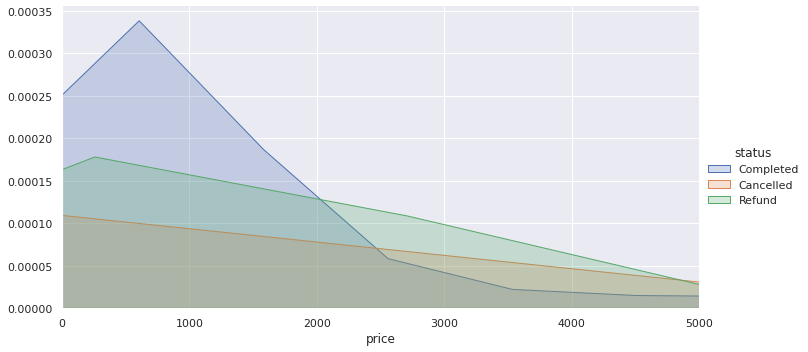

In [35]:
# Checking order statuses against price  
g=(sns.FacetGrid(data[data['price'] >0],
               hue='status', height=5, aspect=2)
  .map(sns.kdeplot, 'price', shade=True)
 .add_legend()
)
plt.xlim(0,5000)

(0.0, 6e-05)

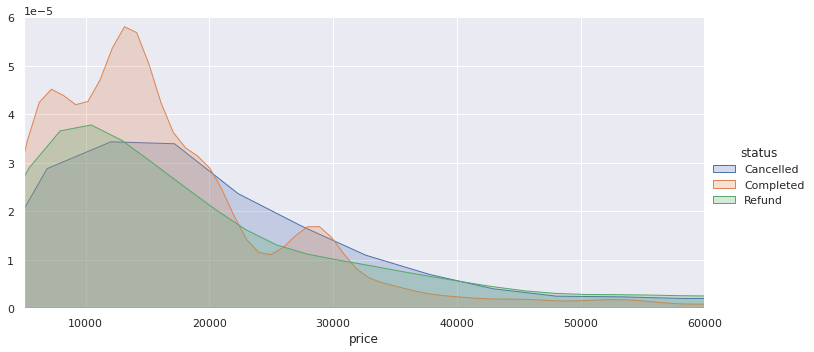

In [36]:
#For orders above 5000 we check order completion and cancel ratio
g=(sns.FacetGrid(data[data['price'] >5000],
               hue='status', height=5, aspect=2)
  .map(sns.kdeplot, 'price', shade=True)
 .add_legend()
)

plt.xlim(5000,60000)
plt.ylim(0.00000,0.00006)

In [37]:
# Scatter plot of category ad price for completed orders
fig = px.scatter(dataordercomp, x='category_name', y='price')
fig.show()

In [39]:
def displaygraph(df,groupbycol,groupbycriteria,title,xlabel,ylabel):
    lsfilterby=df[groupbycriteria].unique().tolist()
    df_dict = {}
    for n in lsfilterby:
        df1 = df[df[groupbycriteria]==n]
        df_dict[n] = df1.groupby(groupbycol)[groupbycriteria].count().reset_index()

    fig = go.Figure()

    for n in lsfilterby:
        fig.add_trace(go.Scatter(x=df_dict[n][groupbycol], y=df_dict[n][groupbycriteria],
                    mode='lines+markers',
                    name=n))    

    fig.update_layout(
    title_text=title, # title of plot
    xaxis_title_text=xlabel, # xaxis label
    yaxis_title_text=ylabel, # yaxis label
    
    )
    fig.show()

In [40]:
#Order Month year vs order status

displaygraph(data,'m-y','status','Order Status by Month','Month','Count')

In [41]:
#Order category vs order status

displaygraph(data,'category_name','status','Order Status by Category','Order Category','Count')

In [42]:
#Order payment method vs order status

displaygraph(data,'payment_method','status','Order Status by Payment Method','Payment Method','Count')

Categories Highest Income
category_name
Mobiles & Tablets     571311652
Appliances            222425236
Entertainment         203827500
Women's Fashion        54711681
Computing              43403775
Men's Fashion          39904585
Others                 34753900
Beauty & Grooming      19547805
Superstore             13839600
Home & Living          13457795
Health & Sports         8868467
Soghaat                 6294703
Kids & Baby             5640601
School & Education       924698
Books                    535345
Name: price, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1.0, 'Categories Sorted by Sales')

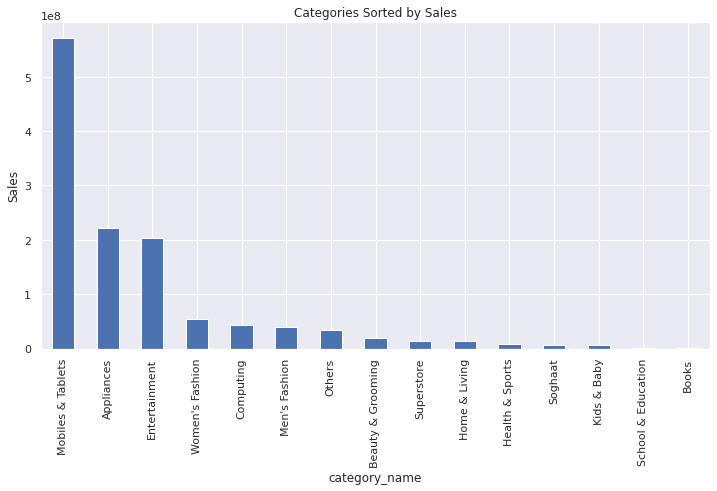

In [43]:
dataordercomp['price']=dataordercomp['price'].astype(int)
print('Categories Highest Income')
print(dataordercomp.groupby('category_name')['price'].sum().sort_values(ascending=False))
dataordercomp.groupby('category_name')['price'].sum().sort_values(ascending=False).plot.bar(figsize=(12,6))#value_counts().sort_values()
plt.ylabel('Sales')
plt.title('Categories Sorted by Sales')

In [44]:
dict_traces={}
lscategory=["Mobiles & Tablets",'Appliances','Entertainment']
for n in lscategory:
        dfcat=dataordercomp[dataordercomp['category_name']==n]
        dict_traces[n] = go.Violin(x=dfcat['category_name'],y =dfcat['price'], meanline_visible = True)

fig.update_layout(
    title_text='Distribution of Top Income generating Categories',
    yaxis_title_text='price', # yaxis label
    showlegend=False
    )        

  
cdata=[]
for n in range(len(dict_traces)):
    key,value=list(dict_traces.items())[n]
    cdata.append(dict_traces[key])
    n+=1

fig = go.Figure(data = cdata)
iplot(fig)

# Actual customer base for all top categories is below 40K with average price of around 11K for Mobiles & Tablets, 8,701 for Appliances and 17.7K for Entertainment. Upper fence for Mobiles & Tablets:34k Upper fence for Appliances:19.6k Upper fence for Entertainment:39.9k

In [45]:
pd.set_option('mode.chained_assignment', None)
dataordercomp['quarter']=dataordercomp['created_at'].dt.quarter
dataordercomp['quarter']=dataordercomp['quarter'].astype(str)
dataordercomp['quarter'].replace(['1','2','3','4'],['Q1','Q2','Q3','Q4'],inplace=True)
dataordercomp['q-y']=dataordercomp['fy'].astype(str)+'-'+dataordercomp['quarter']

In [46]:
qigroup=dataordercomp.groupby(['q-y'])['price'].sum().reset_index(name='Total Sales')#plot.bar()
fig = px.bar(qigroup, x='q-y', y='Total Sales', title="Quarterly Sales",labels={'q-y':'Quarters'})
fig.show()

In [47]:
qcgroup=dataordercomp.groupby(['q-y','category_name'],sort=True)['price'].sum().reset_index(name='Sales')
qcgroup=qcgroup.sort_values(by = ['Sales'], ascending=[True])
fig = px.bar(qcgroup, x='q-y', y='Sales', color='category_name',title="Quarterly Category Wise Sale",labels={'q-y':'Quarters','category_name':'Category name'})
fig.show()

# Top 4 consistent profitable categories are Mobiles & Tablets, Appliances, Entertainment and Women's Fashion

In [48]:
dfq4=dataordercomp.loc[(dataordercomp['q-y']=='FY18-Q4'),['sku','category_name','price']].value_counts()[:15].reset_index(name='Number of Orders')
dfq4=dfq4.sort_values(by = ['Number of Orders'], ascending=[False])
print('Top 15 selling Items of Quarter-FY18-Q4')
print(dfq4)
fig = px.bar(dfq4, x='category_name', y='Number of Orders', color='sku',title="Top 15 selling Items of Quarter-FY18-Q4",labels={'q-y':'Quarters','category_name':'Category name'},hover_name="sku", hover_data=["category_name", "Number of Orders", "price"])
fig.show()

Top 15 selling Items of Quarter-FY18-Q4
                    sku      category_name  price  Number of Orders
0   MATSAM59DB75ADB2F80  Mobiles & Tablets  13698              1701
1   MATSAM59DB75ADB2F80  Mobiles & Tablets  14000               902
2   MATSAM5A0BFFEF4DA20  Mobiles & Tablets  14000               498
3   MATSAM5A0BFFEEED718  Mobiles & Tablets  14000               443
4   MATIDR59BA510306FBE  Mobiles & Tablets   6700               417
5   ENTECO5A0C1CCF5C177      Entertainment  27396               397
6   APPDAW59F97AFF95276         Appliances   5499               364
7   APPDAW59FF034935DBA         Appliances   7945               361
8   MATSAM59DB757FB47A2  Mobiles & Tablets  69792               344
9   APPNAT5A0A01860CE92         Appliances    868               343
10  MATIDR59BA5107902DF  Mobiles & Tablets   6700               330
11  APPNAT5A018FEDA562F         Appliances    699               256
12  APPTHU59F6F07255F50         Appliances    499               214
13  MATS

In [49]:
qorders=dataordercomp.groupby('q-y')['category_name'].value_counts().reset_index(name='Number of Orders')
qorders=qorders.sort_values(by = ['Number of Orders'], ascending=[True])
fig = px.bar(qorders, x='q-y', y='Number of Orders', color='category_name',title="Quarterly Category Wise Sale-Number of Orders",labels={'q-y':'Quarters','category_name':'Category name'})
fig.show()

In [50]:
def human_format(num):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    return '%.2f%s' % (num, ['', 'K', 'M', 'B', 'T', 'P'][magnitude])

In [51]:
pabovefifty=dataordercomp.loc[(dataordercomp['price']>50000),'price']
pabovefifty['price']=dataordercomp.loc[(dataordercomp['price']>50000),'price']
pbins=pd.qcut(pabovefifty['price'], q=5).value_counts().reset_index(name='No of Orders')#plot.bar(figsize=(12,6))
pbins.rename(columns = {'index' : 'price'}, inplace = True)
pbins['price']=pbins['price'].astype(str)
# plt.ylabel('Number of Orders')
# plt.title('Price Bins For Orders having Price above Fifty Thousand- Total Sales: Rs%s' % human_format(pabovefifty['price'].sum()))
fig = px.pie(pbins, values='No of Orders', names='price', title='Price Intervals For Orders having Price above Fifty Thousand- Total Sales: Rs%s' % human_format(pabovefifty['price'].sum()))
fig.show()

In [52]:
pbelowfifty=dataordercomp.loc[(dataordercomp['price']<50000),'price']
pbelowfifty['price']=dataordercomp.loc[(dataordercomp['price']<50000),'price']
pbins=pd.qcut(pbelowfifty['price'], q=5).value_counts().reset_index(name='No of Orders')#.plot.bar(figsize=(12,6))
pbins.rename(columns = {'index' : 'price'}, inplace = True)
pbins['price']=pbins['price'].astype(str)
fig = px.pie(pbins, values='No of Orders', names='price', title='Price Intervals For Orders having Price below Fifty Thousand- Total Sales: Rs%s' % human_format(pbelowfifty['price'].sum()))
fig.show()

In [53]:
# Time based Sales analysis 
df=pd.DataFrame({'order_count':dataordercomp.groupby(['created_at']).size()})

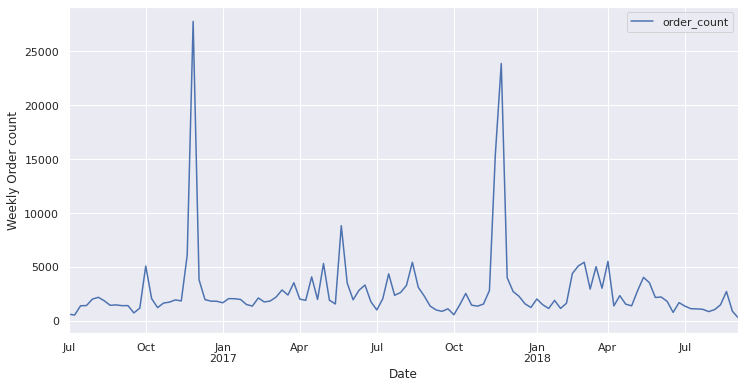

In [54]:

weekly = df.resample('W').sum()
weekly.plot(figsize=(12,6))
plt.ylabel('Weekly Order count')
plt.xlabel('Date');

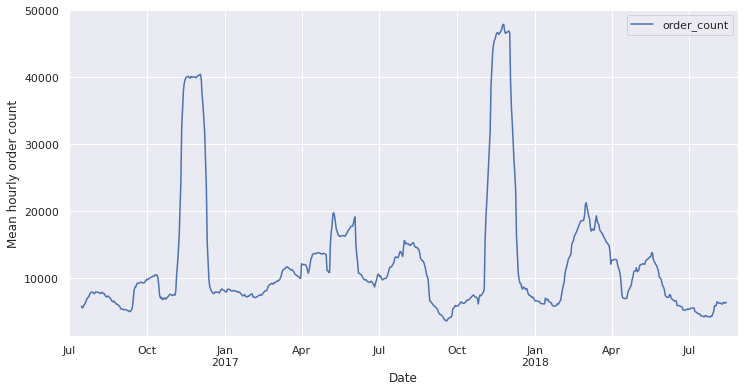

In [55]:
daily = df.resample('D').sum()
daily.rolling(30, center=True).sum().plot(figsize=(12,6))
plt.ylabel('Mean hourly order count')
plt.xlabel('Date');

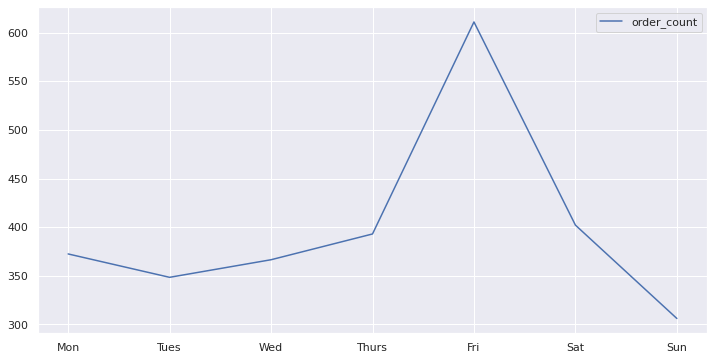

In [56]:
by_weekday = df.groupby(df.index.dayofweek).mean()
by_weekday.index = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun']
by_weekday.plot(figsize=(12,6)); 

# Peak sales months are Nov 2016 and 2017, whereas Friday has on average highest orders as compared to other week days. This may be due to Friday sale.

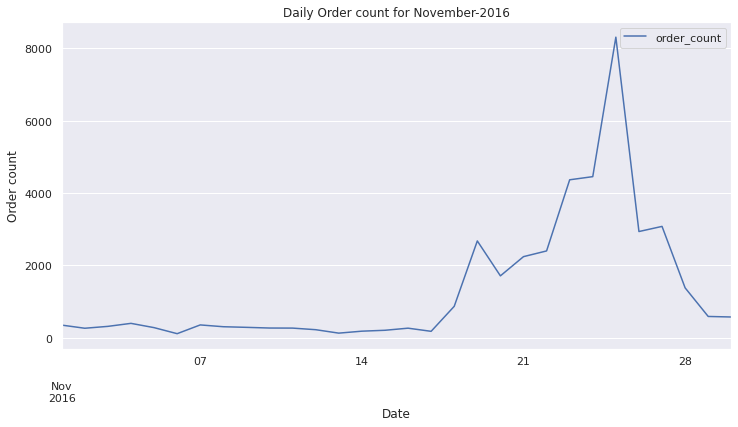

In [57]:
daily = df.loc['11-2016'].resample('D').sum()
daily.plot(figsize=(12,6))
plt.title('Daily Order count for November-2016')
plt.ylabel('Order count')
plt.xlabel('Date');

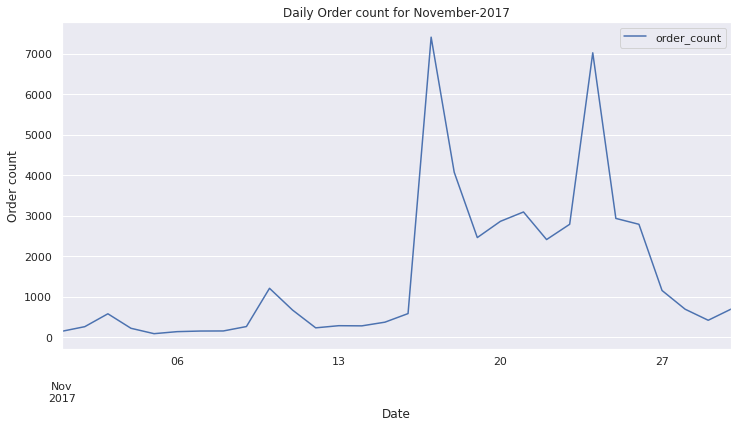

In [58]:
daily = df.loc['11-2017'].resample('D').sum()
daily.plot(figsize=(12,6))
plt.title('Daily Order count for November-2017')
plt.ylabel('Order count')
plt.xlabel('Date');